# 1. Generando un sliding window

Instalamos las libreria

In [1]:
!pip install opencv-python-headless==4.8.0.74

Reason for being yanked: deprecated, use 4.8.0.76
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 49.1/49.1 MB 10.7 MB/s eta 0:00:00
  Attempting uninstall: opencv-python-headless
    Found existing installation: opencv-python-headless 4.10.0.84
    Uninstalling opencv-python-headless-4.10.0.84:
      Successfully uninstalled opencv-python-headless-4.10.0.84
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
albucore 0.0.19 requires opencv-python-headless>=4.9.0.80, but you have opencv-python-headless 4.8.0.74 which is incompatible.
albumentations 1.4.20 requires opencv-python-headless>=4.9.0.80, but you have opencv-python-headless 4.8.0.74 which is incompatible.


Importamos la librerias a usar

In [21]:
import cv2
import matplotlib.pyplot as plt
import matplotlib.patches as patches
import os

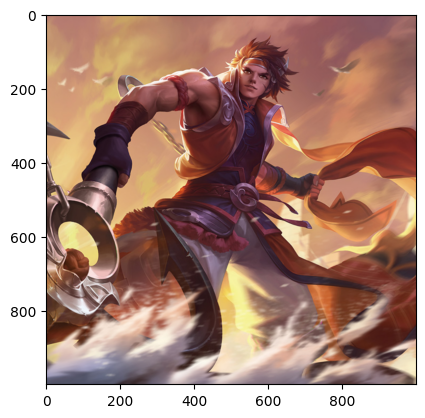

In [22]:
np_image = cv2.imread('/content/sun ce.jpg') #cargar la imagen
np_image = cv2.cvtColor(np_image, cv2.COLOR_BGR2RGB)  #cambio formato color de la imagen a RGB
np_image = cv2.resize(np_image, dsize=(1000, 1000)) #resize de tamaño de imagen
plt.imshow(np_image) #mostar imagen

Creamos una función para una ventana deslizante (sliding window)

La función genera (usando yield) regiones específicas de una imagen mediante el desplazamiento de una ventana de tamaño fijo por la imagen, con pasos definidos

In [23]:
def sliding_window(image, step, ws):  #parametros(imagen ,tamaño paso , tamaño de window)
  for y in range(0, image.shape[0]-ws[1]+1, step):#itera por fila, shape[0]=altura, ws[1]=altura(el Y)
    for x in range(0, image.shape[1]-ws[0]+1, step): #itera por columna, shape[1]=ancho, ws[0]=ancho(el X)
      yield (x, y, image[y:y + ws[1], x:x +ws[0]]) #muestra una porcion de la imagen

In [24]:
windows = sliding_window(np_image, 200, (200, 200))

In [26]:
os.makedirs('sliding_window_')  #creamos una carpeta

<ipython-input-27-294f7c602287>:3: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  f, axarr = plt.subplots(1, 2, figsize=(12, 12))


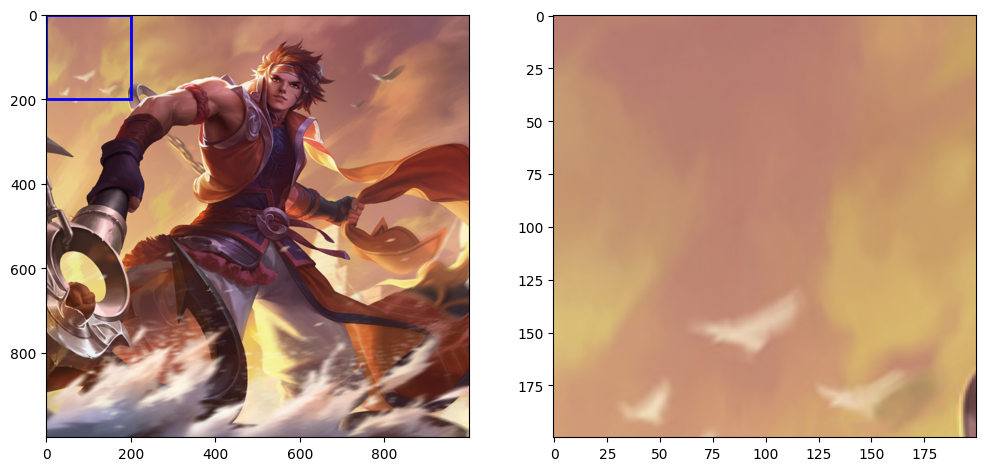

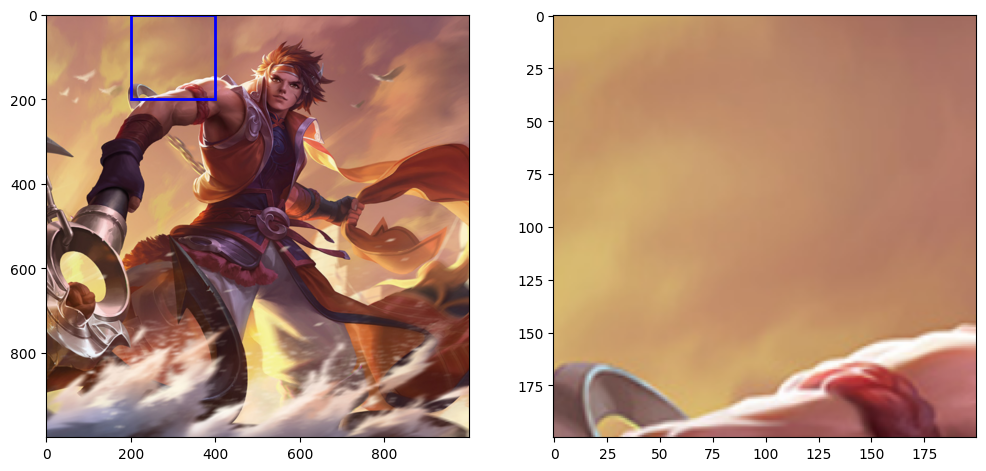

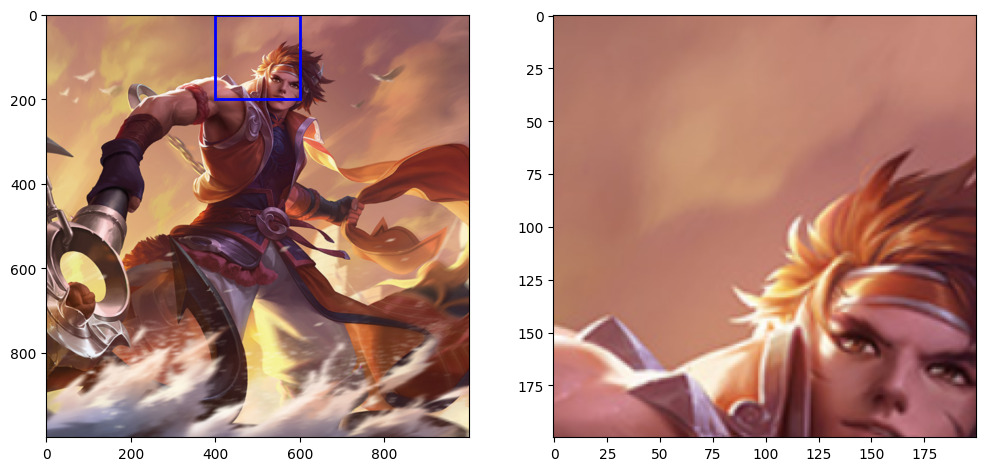

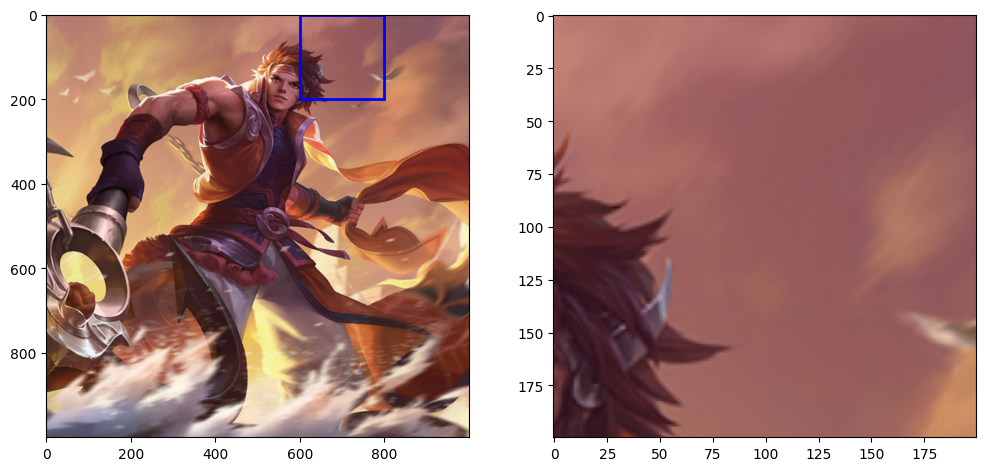

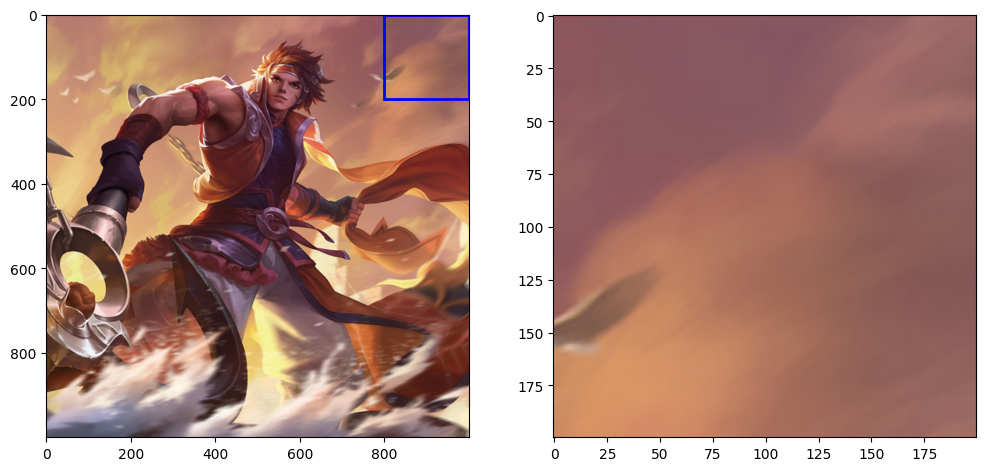

...

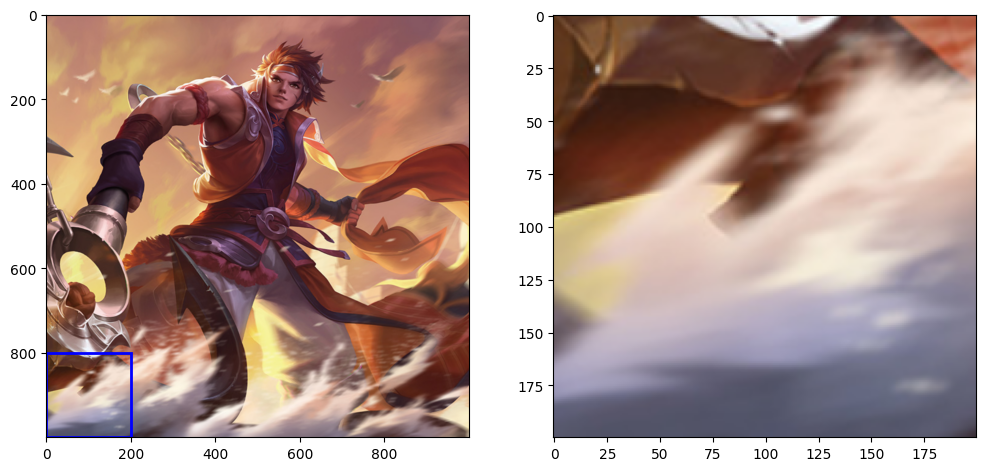

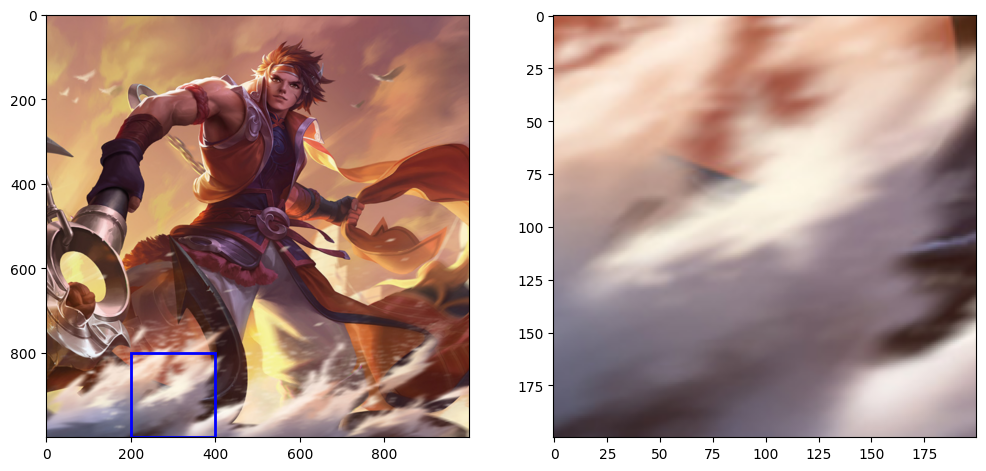

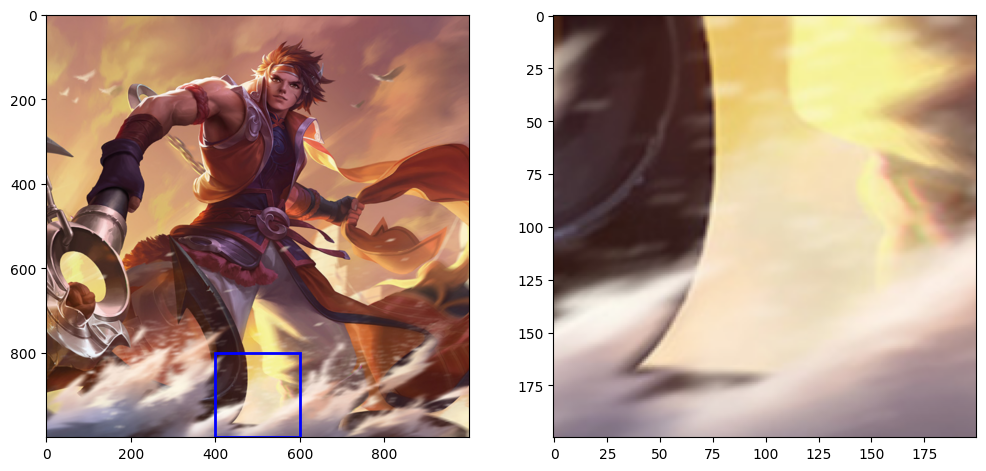

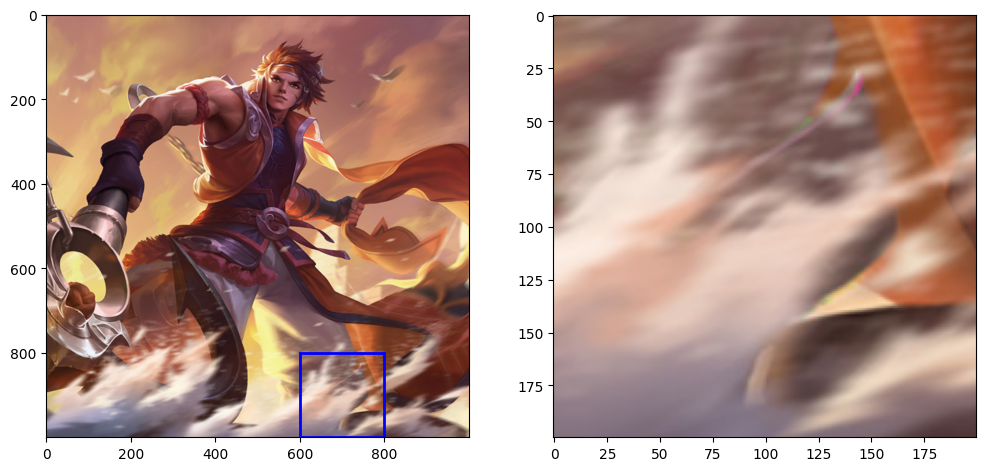

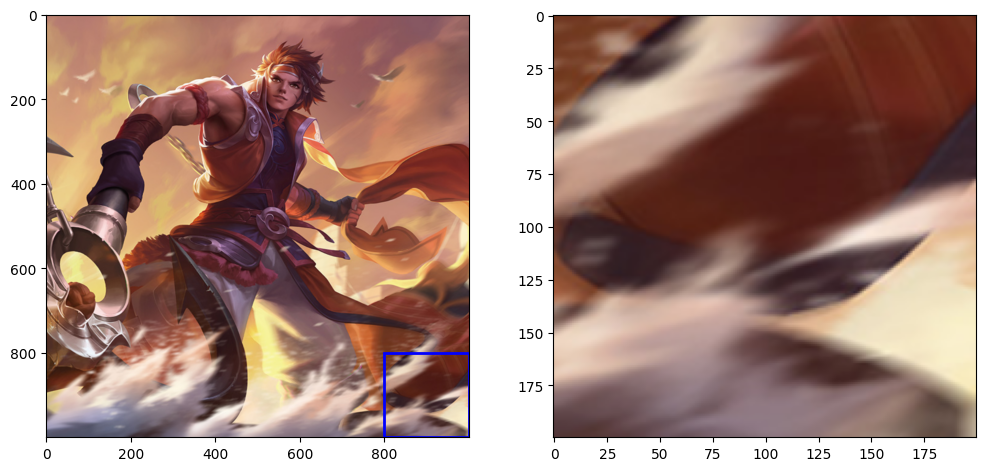

In [27]:
#mostramos el recorrido de las ventanas y las guardamos en una carpeta
for x, window in enumerate(windows):
  f, axarr = plt.subplots(1, 2, figsize=(12, 12))
  axarr[0].imshow(np_image)
  rect = patches.Rectangle((window[0], window[1]), 200, 200, linewidth=2, edgecolor='b', facecolor='none')
  axarr[0].add_patch(rect)
  axarr[1].imshow(window[2])
  f.savefig('sliding_window_/'+str(x)+'.png', dpi=f.dpi)

In [11]:
#creamos variables para la carpeta donde se guardaron las imagenes y otra para el video que haremos.
image_folder = 'sliding_window'
video_name = 'video.avi'

#se crea una lista llamada images q' contiene únicamente los nombres de los archivos con extensión .png que están en la carpeta especificada por image_folder.
images = [img for img in os.listdir(image_folder) if img.endswith('.png')]

In [12]:
#tomamos la lista "images" previamente generada y los ordenamos
images = sorted(images, key=lambda x: int(os.path.splitext(x)[0]))

In [13]:
frame = cv2.imread(os.path.join(image_folder, images[0]))

In [14]:
height, width, layer = frame.shape

In [15]:
#generamos el video
video = cv2.VideoWriter(video_name, 0, 1, (width, height))

In [16]:
#aqui hacemos la lectura de la imagenes para generar el video
for image in images:
  video.write(cv2.imread(os.path.join(image_folder, image)))
video.release()